<a href="https://colab.research.google.com/github/Norod/my-colab-experiments/blob/master/fun_with_stylegan2_ffhq.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
%cd /content/
!pip install typeguard
!git clone https://github.com/NVlabs/stylegan2.git
%cd stylegan2
!git clone https://github.com/kylemcdonald/python-utils.git utils

/content
Cloning into 'stylegan2'...
remote: Enumerating objects: 73, done.
remote: Total 73 (delta 0), reused 0 (delta 0), pack-reused 73
Unpacking objects: 100% (73/73), done.
/content/stylegan2
Cloning into 'utils'...
remote: Enumerating objects: 100, done.
remote: Counting objects: 100% (100/100), done.
remote: Compressing objects: 100% (75/75), done.
remote: Total 194 (delta 57), reused 60 (delta 25), pack-reused 94
Receiving objects: 100% (194/194), 45.78 KiB | 15.26 MiB/s, done.
Resolving deltas: 100% (101/101), done.


In [2]:
import os
import pickle
import numpy as np
import PIL.Image
import dnnlib
import dnnlib.tflib as tflib
from dnnlib.tflib.autosummary import autosummary

from utils.imutil import imshow, imresize
from utils.mosaic import make_mosaic

tflib.init_tf()

# Load pre-trained network.
url = 'https://norod78.s3.amazonaws.com/models/stylegan2-ffhq-config-f.pkl'
with dnnlib.util.open_url(url, cache_dir='/tmp/') as f:
    _G, _D, Gs = pickle.load(f)
    # _G = Instantaneous snapshot of the generator. Mainly useful for resuming a previous training run.
    # _D = Instantaneous snapshot of the discriminator. Mainly useful for resuming a previous training run.
    # Gs = Long-term average of the generator. Yields higher-quality results than the instantaneous snapshot.

Setting up TensorFlow plugin "fused_bias_act.cu": Preprocessing... Compiling... Loading... Done.
Setting up TensorFlow plugin "upfirdn_2d.cu": Preprocessing... Compiling... Loading... Done.


In [3]:
!ls /tmp/

2320e4b6ba66ae237cbfe62e90d73e34_https___norod78.s3.amazonaws.com_models_stylegan2-ffhq-config-f.pkl


In [0]:
!mkdir './out'

In [0]:
from PIL import Image

# Pick latent vector.
#random_seed = 1000
random_seed = None
rnd = np.random.RandomState(random_seed)
latents = rnd.randn(1, Gs.input_shape[1])

In [16]:


qnumber_of_images = 48  #Actual number of video clip frames is qnumber_of_images * 4

# Generate image.
all = []
counter = 0
reverse_counter = (qnumber_of_images * 2) - 1
truncation_psi_vector_1 = (np.logspace(-2,1,num = qnumber_of_images, base=10.0) - 12)
truncation_psi_vector_2 = np.absolute(np.flip(truncation_psi_vector_1))
truncation_psi_vector = truncation_psi_vector_1 + truncation_psi_vector_2
for i in truncation_psi_vector:
  print(i)
  fmt = dict(func=tflib.convert_images_to_uint8, nchw_to_nhwc=True)
  images = Gs.run(latents, None, truncation_psi=i, randomize_noise=True, output_transform=fmt)
  all.append(images[0])
  im = Image.fromarray(images[0])
  im.save('./out/StyleGanImg_' + str(counter) + '.jpg')
  if (reverse_counter > counter):
    im.save('./out/StyleGanImg_' + str(reverse_counter) + '.jpg')
  counter = counter + 1
  reverse_counter = reverse_counter - 1
  

-9.99
-8.621585174149027
-7.439742546027485
-6.418896891120956
-5.536956979854914
-4.774837520582117
-4.116046151448361
-3.5463265435881617
-3.053349892358179
-2.6264481204395143
-2.2563830192901637
-1.9351463331393184
-1.6557864593157916
-1.4122580146836672
-1.199291012783739
-1.012276820657485
-0.8471684274447409
-0.7003928665549051
-0.5687738962163031
-0.449463265201004
-0.33987907630665504
-0.2376499137732253
-0.14056352554489848
-0.04651894985472893
0.04651894985472893
0.14056352554489848
0.2376499137732253
0.33987907630665504
0.449463265201004
0.5687738962163031
0.7003928665549051
0.8471684274447409
1.012276820657485
1.199291012783739
1.4122580146836672
1.6557864593157916
1.9351463331393184
2.2563830192901637
2.6264481204395143
3.053349892358179
3.5463265435881617
4.116046151448361
4.774837520582117
5.536956979854914
6.418896891120956
7.439742546027485
8.621585174149027
9.99


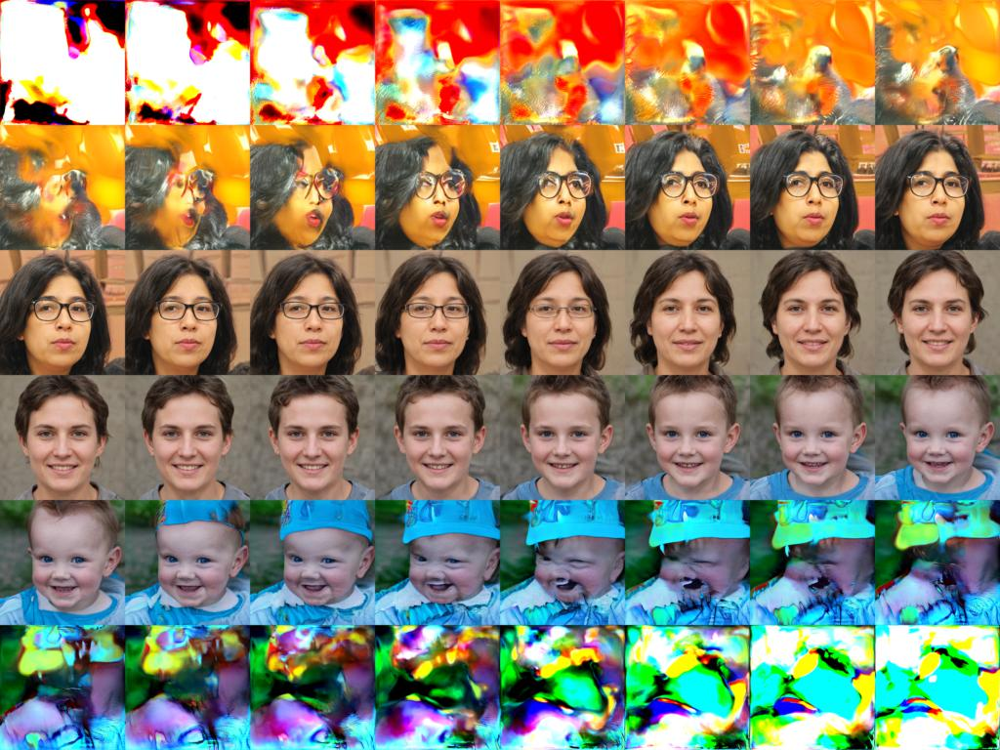

In [17]:
mosaic = make_mosaic(np.asarray(all))
mosaic = imresize(mosaic, max_side=1024) # comment this out for higher res
imshow(mosaic, retina=True, fmt='jpg')

In [18]:
!ffmpeg -f image2  -framerate 8 -i "./out/StyleGanImg_%01d.jpg" -b:v 8192k -r 30 -y -c:v libx264 StyleGanImg_all.mp4

ffmpeg version 3.4.6-0ubuntu0.18.04.1 Copyright (c) 2000-2019 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.3.0-16ubuntu3)
  configuration: --prefix=/usr --extra-version=0ubuntu0.18.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvorbis --enable-libvpx --enable-libwavpack --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --ena

In [19]:
!ls -latr /content/stylegan/StyleGanImg_all.mp4

from IPython.display import HTML
from base64 import b64encode
mp4 = open('StyleGanImg_all.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=512 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

ls: cannot access '/content/stylegan/StyleGanImg_all.mp4': No such file or directory


In [0]:
#import shutil
#shutil.make_archive('StyleGanImg_all', 'zip', './out/')

#!rm -rf './out'